# Analysing Creadit Card Customers

This project visualizes data from the following dataset: https://www.kaggle.com/sakshigoyal7/credit-card-customers

The dataset includes the demographic and financial data of bank customers that have a credit card. In addition, it shows whether the customers have left their credit card services (attritted) or not.

The aim of the data visualizations is to determine what type of customer are more likely to leave their credit card service. Later on, a machine learning model can be trained to directly predict this.


In [1]:
#import the necessary libraries

import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Import the CSV file into the code
data = pd.read_csv("BankChurners.csv")

In [3]:
#Determine the shape of the dataset
#We see that we have 10 127 rows of data and 23 columns
data.shape

(10127, 23)

In [4]:
#View the first 5 rows
data.head(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [5]:
#View the last 5 rows
data.tail(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,0.996620,0.003377


In [6]:
#View a specific list of rows
data.iloc[[123, 125, 200]]

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
123,785387883,Existing Customer,47,F,3,High School,Single,$40K - $60K,Blue,41,...,3788.0,1540,2248.0,0.566,1594,47,0.382,0.407,0.000305,0.99969
125,711318033,Existing Customer,47,M,3,Graduate,Single,$60K - $80K,Blue,36,...,2926.0,0,2926.0,0.676,1304,24,0.846,0.000,0.000118,0.99988
200,720707283,Existing Customer,48,M,4,Unknown,Married,$80K - $120K,Blue,36,...,5288.0,866,4422.0,0.869,1777,42,0.750,0.164,0.000076,0.99992


# Determining Types of Data

The following pieces of code check whether they are any null values in the dataset. 

In [7]:
#Check the data type and properties of every column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

# Dropping Unnecessary Columns

In [8]:
#let's drop some of the columns that will not help us in our analysis. 

data.drop('CLIENTNUM', axis=1, inplace=True)

In [9]:
data.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
           'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], 
          axis=1, inplace=True)

In [10]:
#Check how the data looks like now
data.head(5)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [12]:
#Below is sample code if you want to rename the columns

#headers = ["Name of column 1", ... , "Name of column 2"]
#data.columns = headers

# Creating New Columns of Data

In [13]:
#Below is sample code to create a new column of data
Avg_Amt_Per_Trans = data['Total_Trans_Amt']/data['Total_Trans_Ct']

#Inserting this column at the appropriate position
data.insert(18, "Avg_Amt_Per_Trans", Avg_Amt_Per_Trans)

In [14]:
#Below is sample code to change the data type of a column

#data["Total_Revolving_Bal"] = data["Total_Revolving_Bal"].astype("float")

# Exploratory Data Analysis

In [15]:
data.describe(include='all')

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Avg_Amt_Per_Trans,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127,10127.000000,10127,10127.000000,10127,10127,10127,10127,10127.000000,10127.000000,...,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
unique,2,NaN,2,NaN,7,4,6,4,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Existing Customer,NaN,F,NaN,Graduate,Married,Less than $40K,Blue,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,8500,NaN,5358,NaN,3128,4687,3561,9436,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,46.325960,NaN,2.346203,NaN,NaN,NaN,NaN,35.928409,3.812580,...,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,62.612717,0.712222,0.274894
std,NaN,8.016814,NaN,1.298908,NaN,NaN,NaN,NaN,7.986416,1.554408,...,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,26.404198,0.238086,0.275691
min,NaN,26.000000,NaN,0.000000,NaN,NaN,NaN,NaN,13.000000,1.000000,...,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,19.137931,0.000000,0.000000
25%,NaN,41.000000,NaN,1.000000,NaN,NaN,NaN,NaN,31.000000,3.000000,...,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,47.514573,0.582000,0.023000
50%,NaN,46.000000,NaN,2.000000,NaN,NaN,NaN,NaN,36.000000,4.000000,...,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,55.794872,0.702000,0.176000
75%,NaN,52.000000,NaN,3.000000,NaN,NaN,NaN,NaN,40.000000,5.000000,...,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,65.476673,0.818000,0.503000


Based on the information below, 16% of customers have attrited, and 53% of custimers are female.

In [16]:
#Determining the number of instances for categorical features 
data["Attrition_Flag"].value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

In [17]:
data["Gender"].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

In [18]:
#Sorting based on Customer_Age
data.sort_values("Customer_Age", ascending = False)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Avg_Amt_Per_Trans,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
251,Existing Customer,73,M,0,High School,Married,$40K - $60K,Blue,36,5,...,2,4469.0,1125,3344.0,1.363,1765,34,51.911765,1.615,0.252
254,Existing Customer,70,M,0,High School,Married,Less than $40K,Blue,56,3,...,3,3252.0,1495,1757.0,0.581,1227,15,81.800000,0.875,0.460
198,Attrited Customer,68,M,0,High School,Married,Less than $40K,Blue,52,1,...,2,1438.3,900,538.3,0.743,760,21,36.190476,0.615,0.626
151,Existing Customer,68,M,1,Graduate,Married,Unknown,Blue,56,5,...,3,13860.0,1652,12208.0,1.255,1910,32,59.687500,1.909,0.119
432,Existing Customer,67,F,0,Unknown,Married,Unknown,Blue,56,4,...,3,10509.0,2388,8121.0,0.777,1365,34,40.147059,1.429,0.227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8183,Existing Customer,26,M,0,Unknown,Unknown,Less than $40K,Silver,13,2,...,1,10254.0,0,10254.0,0.510,4258,68,62.617647,0.838,0.000
1158,Existing Customer,26,M,0,College,Single,$60K - $80K,Blue,15,5,...,2,8267.0,1720,6547.0,0.633,1917,37,51.810811,0.480,0.208
2829,Existing Customer,26,M,1,Unknown,Single,Less than $40K,Blue,20,6,...,2,2590.0,1748,842.0,0.626,2804,52,53.923077,0.486,0.675
1565,Existing Customer,26,M,0,Graduate,Single,Less than $40K,Blue,20,6,...,3,1438.3,495,943.3,1.062,2546,40,63.650000,0.333,0.344


In [19]:
#Sorting based on Months_on_book (This caould be a possible Breakout Room Activity)
data.sort_values("Months_on_book", ascending = False)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Avg_Amt_Per_Trans,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1760,Existing Customer,65,F,0,Graduate,Married,Less than $40K,Blue,56,6,...,3,4460.0,1262,3198.0,0.898,1877,41,45.780488,0.783,0.283
2406,Existing Customer,65,F,1,Graduate,Single,Less than $40K,Blue,56,6,...,2,4613.0,1619,2994.0,0.697,2328,62,37.548387,0.722,0.351
177,Existing Customer,67,F,1,Graduate,Married,Less than $40K,Blue,56,4,...,2,3006.0,2517,489.0,2.053,1661,32,51.906250,1.000,0.837
1330,Existing Customer,61,M,0,Graduate,Married,$80K - $120K,Blue,56,4,...,4,8420.0,1389,7031.0,0.522,1114,34,32.764706,0.545,0.165
1321,Existing Customer,65,M,0,Graduate,Married,Less than $40K,Blue,56,6,...,2,2541.0,1616,925.0,0.417,1416,27,52.444444,0.588,0.636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9625,Attrited Customer,30,F,0,Uneducated,Married,Less than $40K,Blue,13,3,...,3,6075.0,0,6075.0,0.923,9242,63,146.698413,0.909,0.000
3841,Existing Customer,41,M,2,Uneducated,Married,$60K - $80K,Blue,13,4,...,2,2243.0,1944,299.0,0.942,3216,77,41.766234,0.674,0.867
1852,Existing Customer,26,M,0,Uneducated,Single,Less than $40K,Blue,13,4,...,4,2237.0,451,1786.0,0.837,2192,36,60.888889,0.440,0.202
6925,Existing Customer,27,F,1,Post-Graduate,Married,Less than $40K,Blue,13,3,...,2,1438.3,990,448.3,0.715,3855,73,52.808219,1.147,0.688


# Analyzing Subsets of Data

In [20]:
#Creating a subset of customers that have a credit limit under 5000
under_5000 = data.loc[data["Credit_Limit"]<= 5000]
#Determining how the income categories of people with a credit limit under 5000
under_5000["Income_Category"].value_counts()

Less than $40K    2831
$40K - $60K       1138
$60K - $80K        476
Unknown            459
$80K - $120K       349
$120K +            106
Name: Income_Category, dtype: int64

In [21]:
#Creating a subset of customers that have an income category = $40K - $60K
Income_40_to_60K = data.loc[data["Income_Category"] == "$40K - $60K"]
#Determining the types of cards of people with this income
Income_40_to_60K["Card_Category"].value_counts()

Blue        1675
Silver        99
Gold          15
Platinum       1
Name: Card_Category, dtype: int64

# Countplot of Income Categories

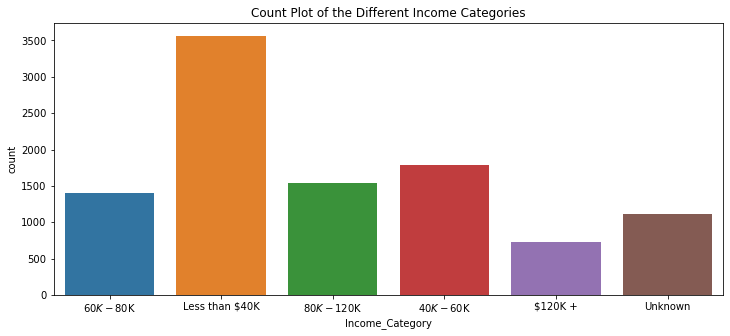

In [22]:
#Plotting a countplot
plt.subplots(figsize=(12, 5))
sns.countplot(x = "Income_Category", data = data)
plt.title("Count Plot of the Different Income Categories")
#plt.xticks(rotation=30)
plt.show()
plt.close()

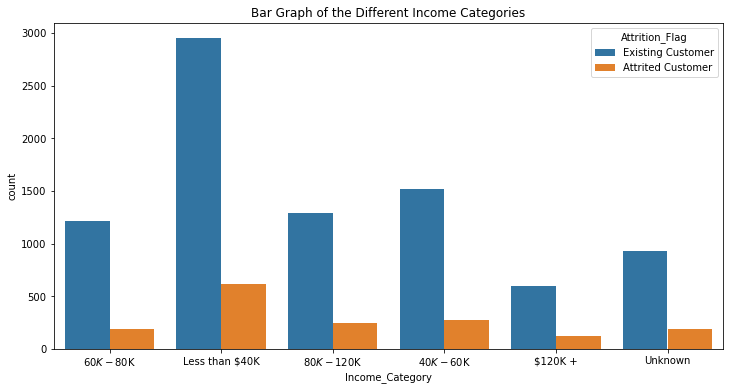

In [23]:
#Plotting a countplot with subcategories
plt.subplots(figsize=(12, 6))
sns.countplot(x = "Income_Category", hue = "Attrition_Flag", data = data)
plt.title("Bar Graph of the Different Income Categories")
#plt.xticks(rotation=30)
plt.show()
plt.close()

# Countplots of Different Features

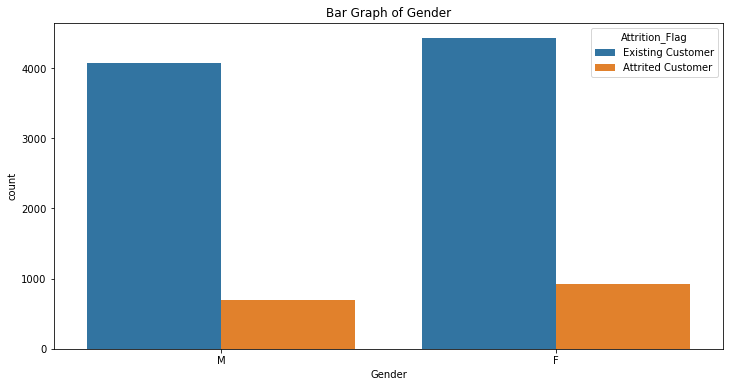

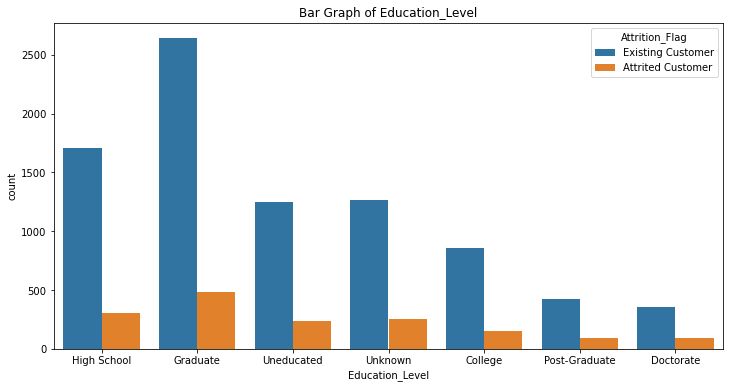

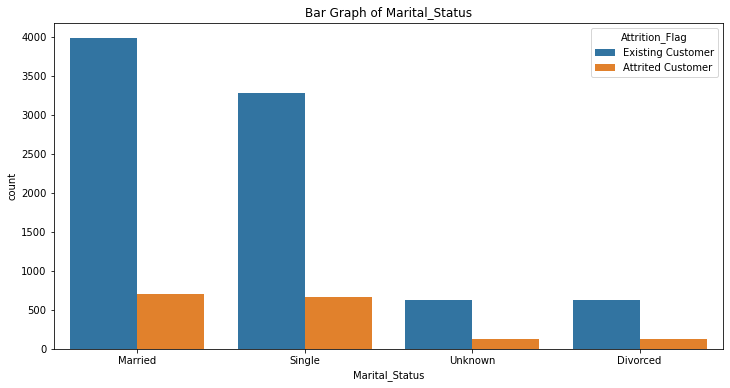

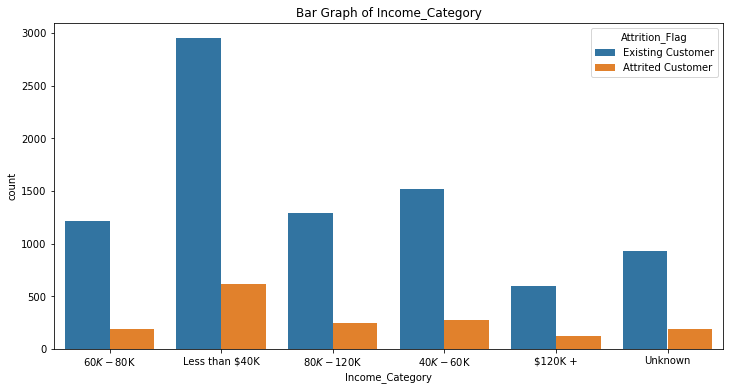

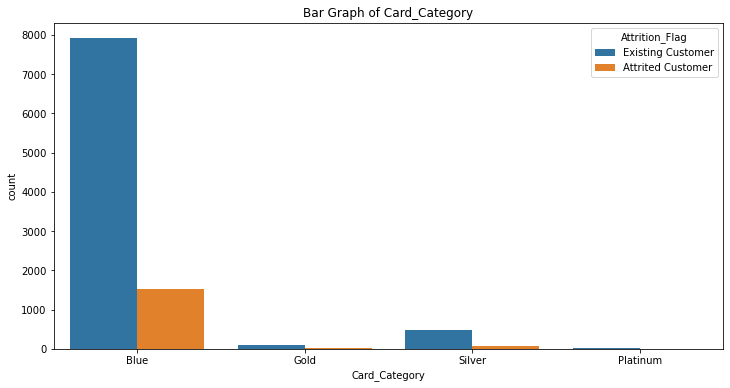

In [24]:
features = ["Gender", "Education_Level", "Marital_Status", 
            "Income_Category", "Card_Category"]

for feature in features:
    #Plotting a countplot with subcategories
    plt.subplots(figsize=(12, 6))
    sns.countplot(x = feature, hue = "Attrition_Flag", data = data)
    plt.title("Bar Graph of " + feature)
    #plt.xticks(rotation=30)
    plt.show()
    plt.close()


# Plotting Boxplots

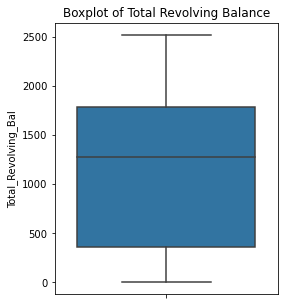

In [25]:
#Plotting a boxplot 
plt.subplots(figsize=(4, 5))
sns.boxplot(y = "Total_Revolving_Bal", data = data)
plt.title("Boxplot of Total Revolving Balance")
plt.show()
plt.close()

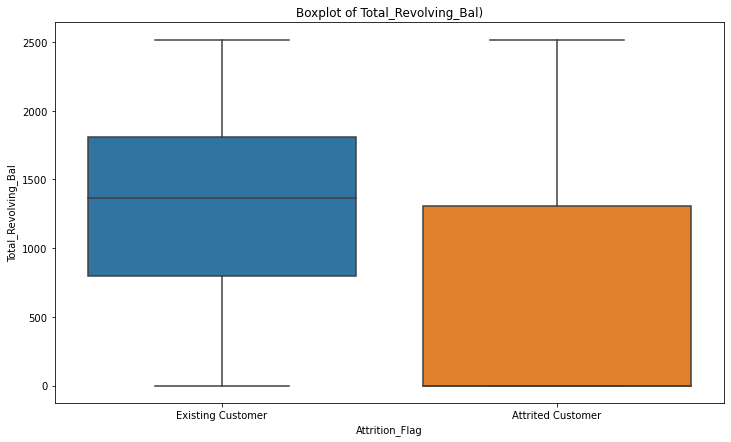

In [26]:
#Plotting a boxplot with subcategories
plt.subplots(figsize=(12, 7))
sns.boxplot(x = "Attrition_Flag", y = "Total_Revolving_Bal", data = data)
plt.title("Boxplot of Total_Revolving_Bal)")
plt.show()
plt.close()

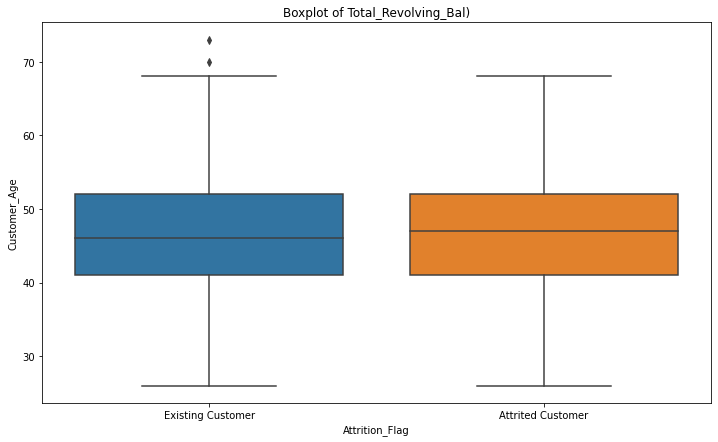

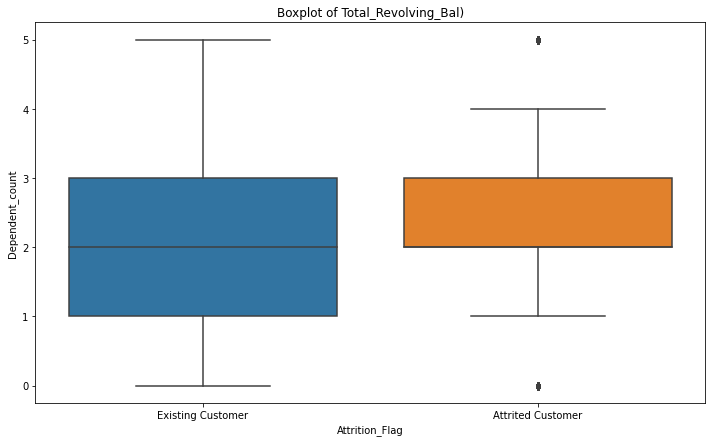

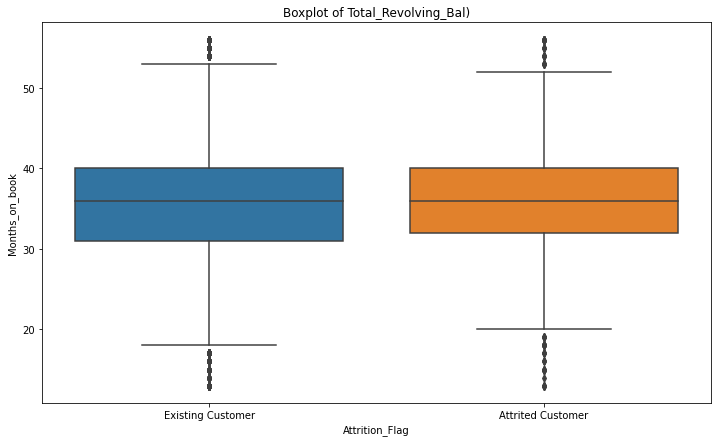

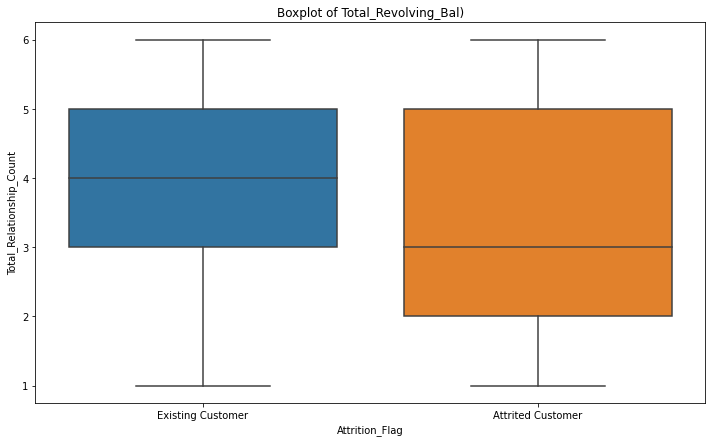

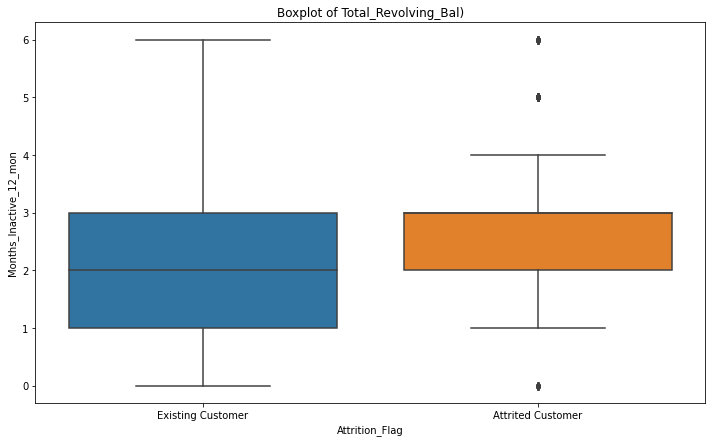

...

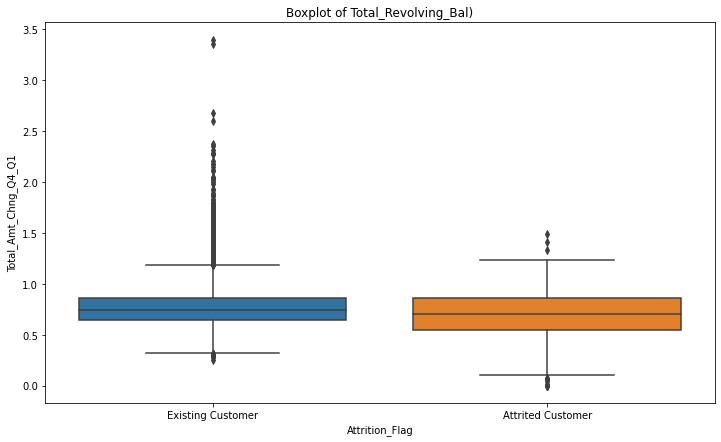

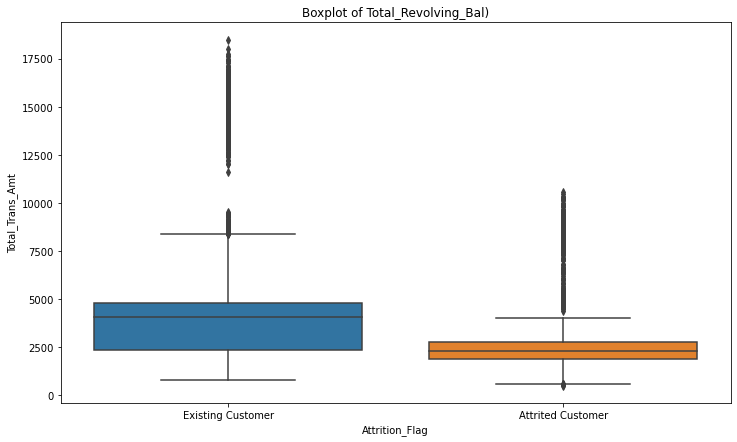

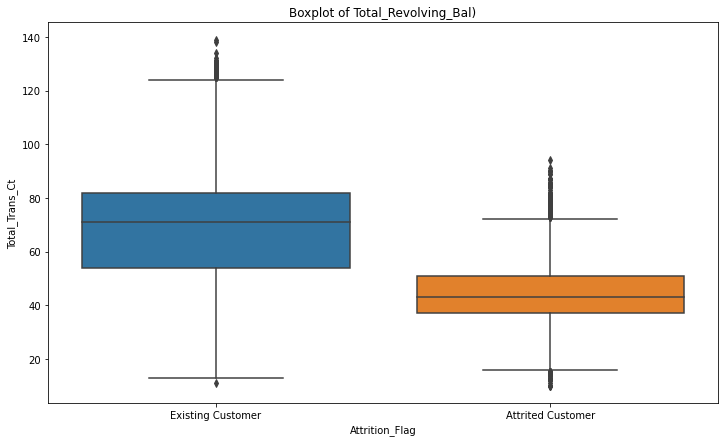

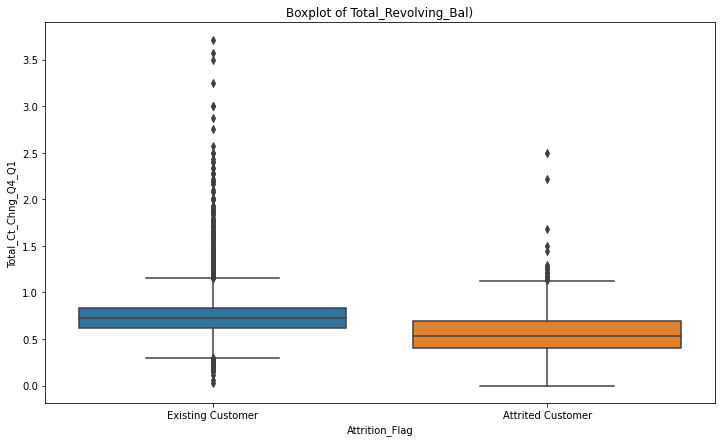

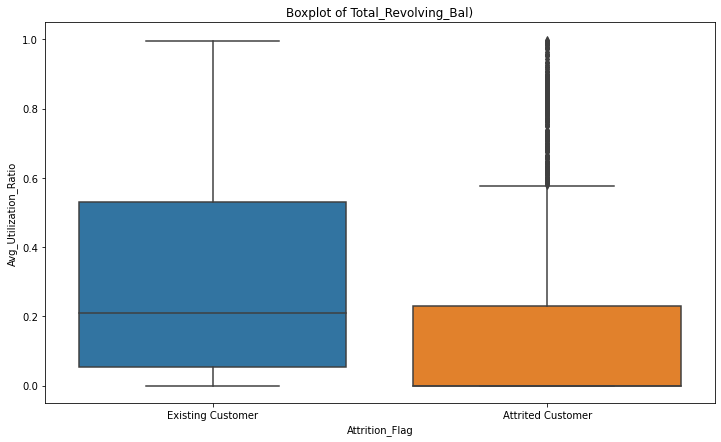

In [27]:
#Plotting a series of boxplots
for feature in ["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", 
               "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", 
                "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"]:
    plt.subplots(figsize=(12, 7))
    sns.boxplot(x = "Attrition_Flag", y = feature, data = data)
    plt.title("Boxplot of Total_Revolving_Bal)")
    plt.show()
    plt.close()

# Plotting Histograms

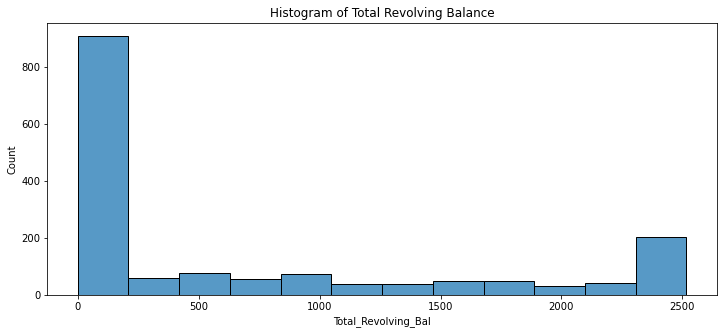

In [28]:
#Plotting a histogram for Attrited Customers 

Attrited_Customers = data.loc[data["Attrition_Flag"] == "Attrited Customer"]

plt.subplots(figsize=(12, 5))
sns.histplot(x = "Total_Revolving_Bal", data = Attrited_Customers)
plt.title("Histogram of Total Revolving Balance")
plt.show()
plt.close()

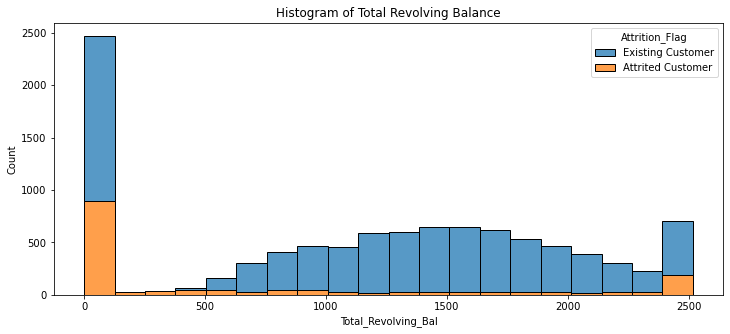

In [29]:
#Plotting a histogram with subcategories
plt.subplots(figsize=(12, 5))
sns.histplot(x = "Total_Revolving_Bal", hue = "Attrition_Flag", multiple = "stack", data = data)
plt.title("Histogram of Total Revolving Balance")
plt.show()
plt.close()

Customer_Age


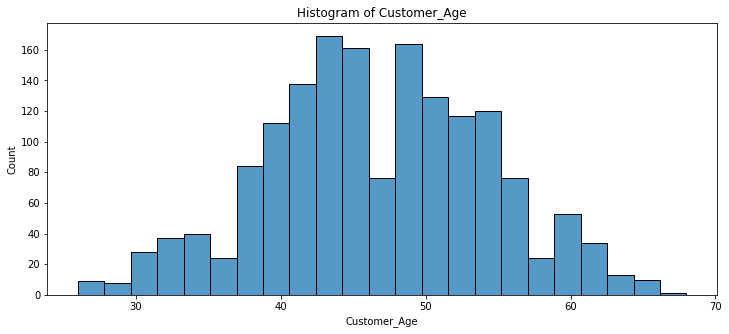

Dependent_count


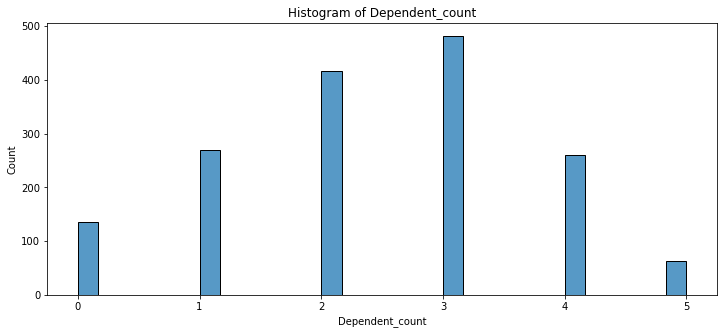

Months_on_book


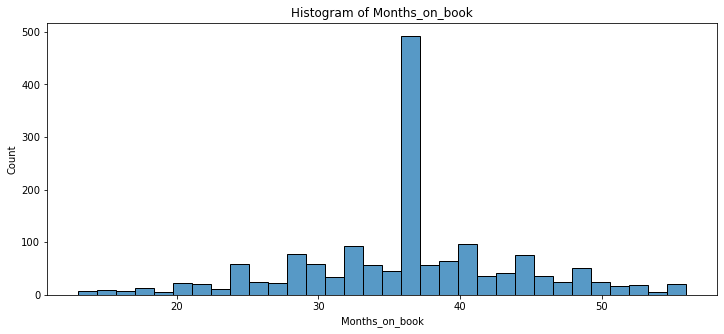

Total_Relationship_Count


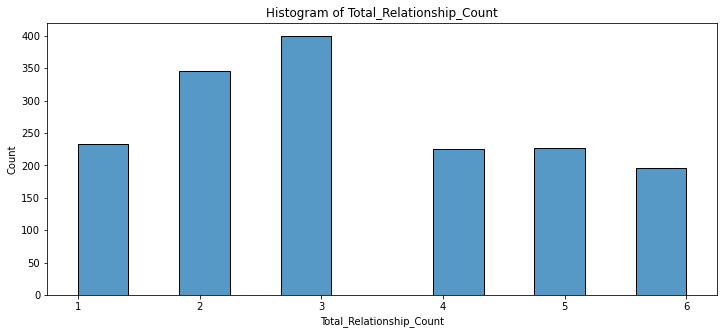

Months_Inactive_12_mon


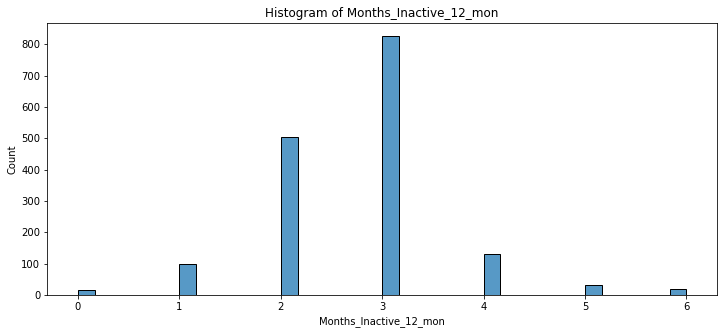

Contacts_Count_12_mon


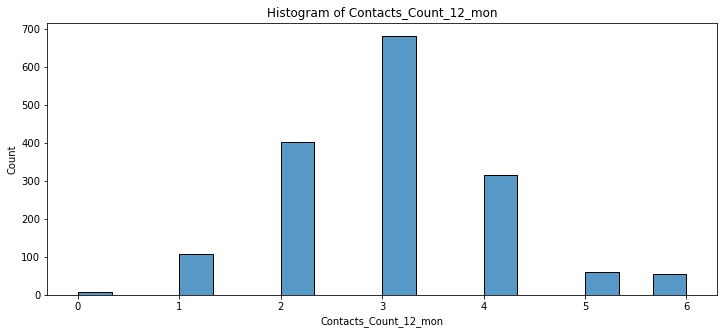

Credit_Limit


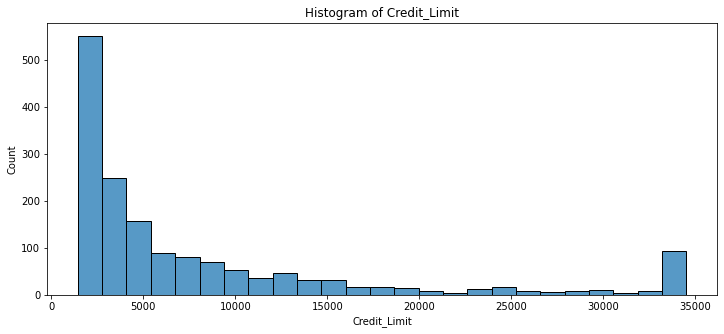

Total_Revolving_Bal


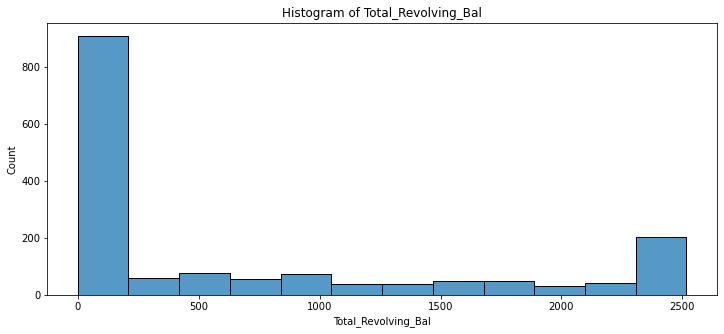

Avg_Open_To_Buy


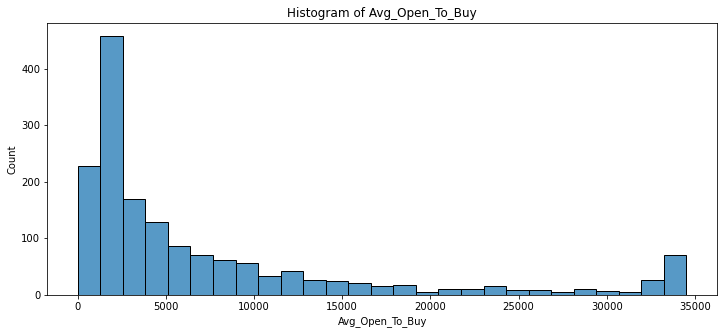

Total_Amt_Chng_Q4_Q1


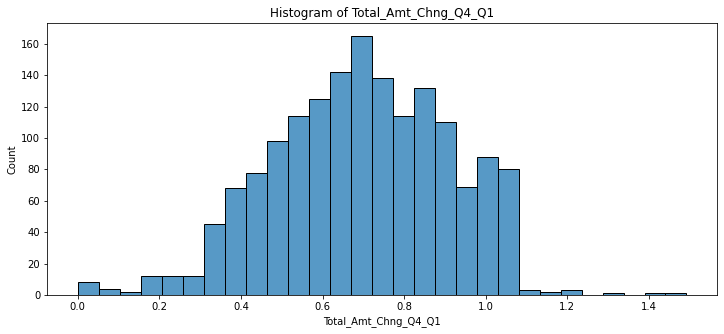

Total_Trans_Amt


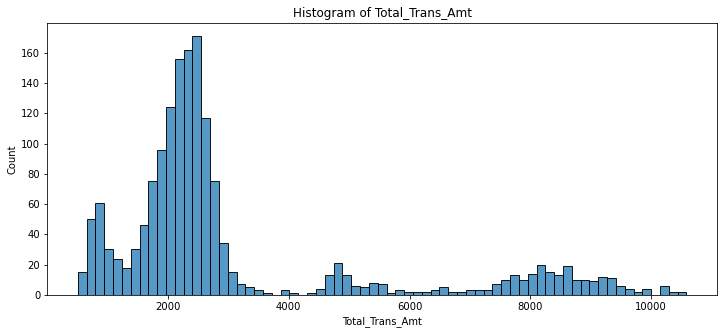

Total_Trans_Ct


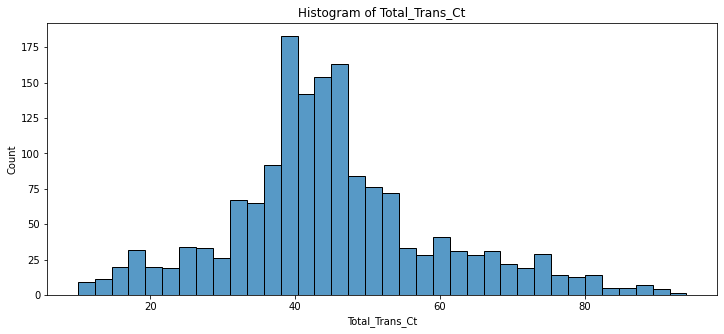

Total_Ct_Chng_Q4_Q1


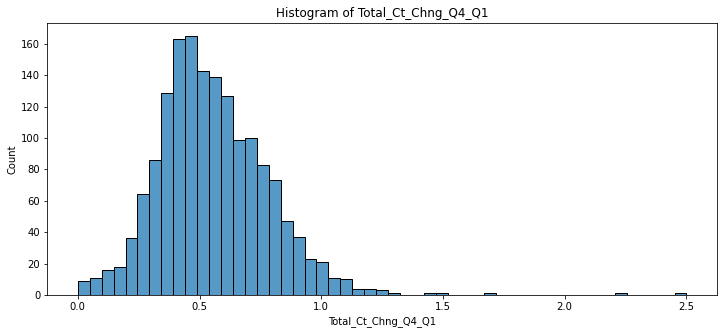

Avg_Utilization_Ratio


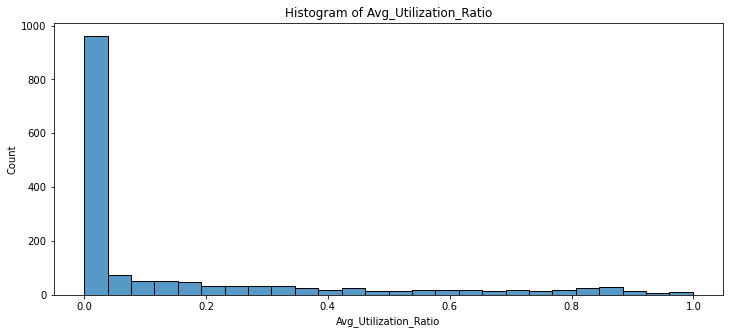

In [30]:
#Plotting a series of histograms
for feature in ["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", 
               "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", 
                "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"]:
    print(feature)
    plt.subplots(figsize=(12, 5))
    sns.histplot(x = feature, data = Attrited_Customers)
    plt.title("Histogram of "+ feature)
    plt.show()
    plt.close()

Customer_Age


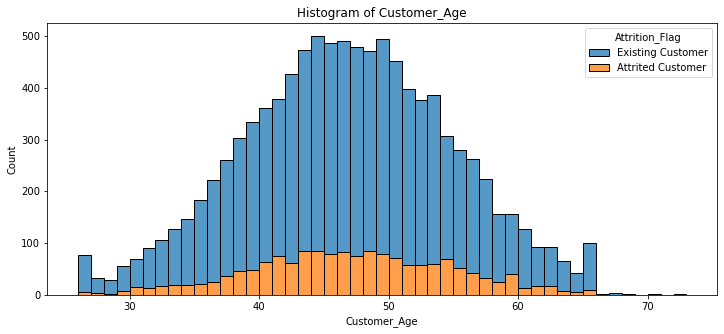

Dependent_count


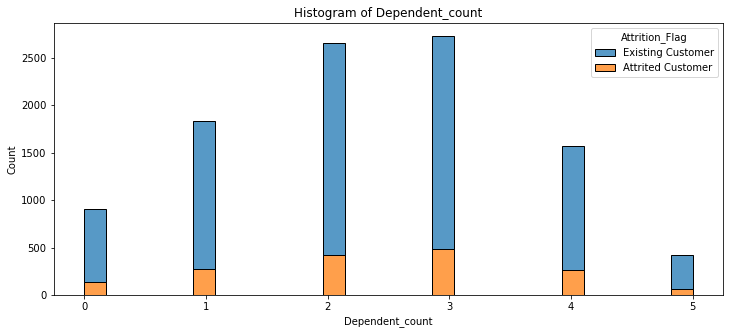

Months_on_book


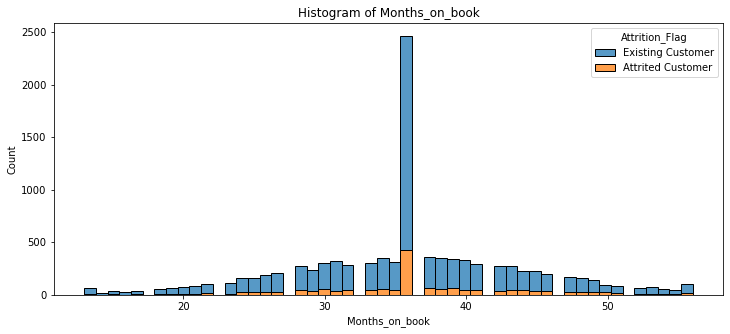

Total_Relationship_Count


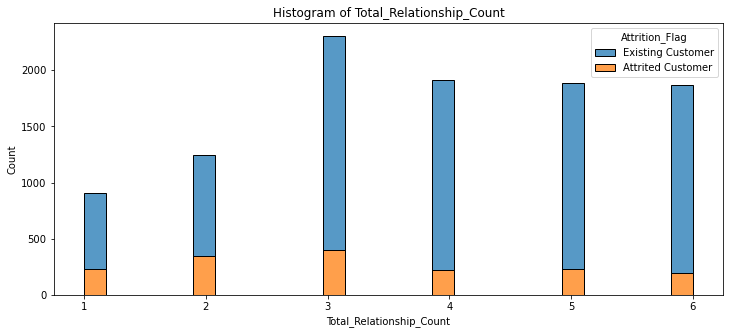

Months_Inactive_12_mon


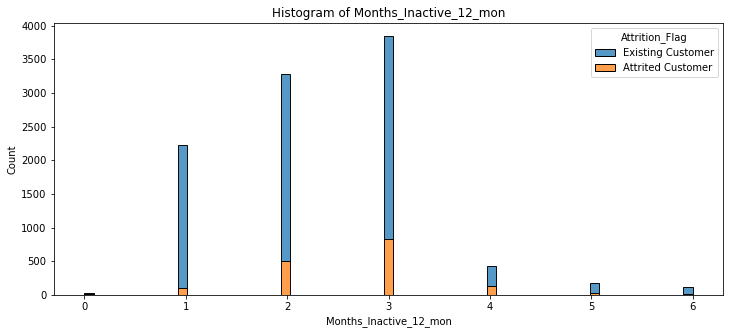

Contacts_Count_12_mon


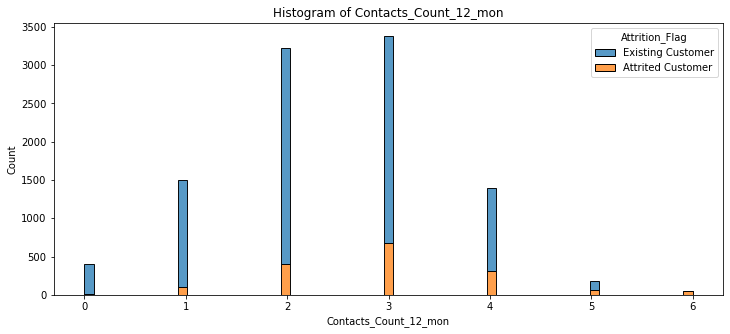

Credit_Limit


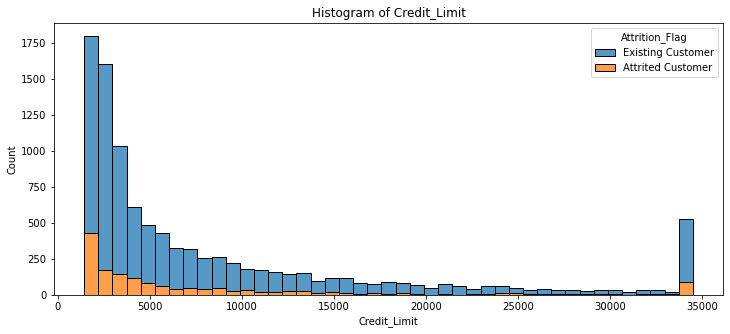

Total_Revolving_Bal


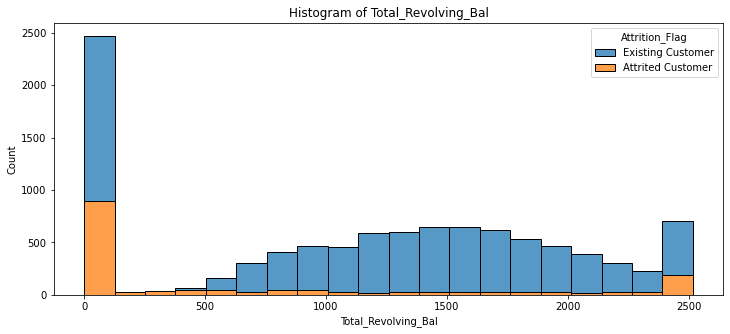

Avg_Open_To_Buy


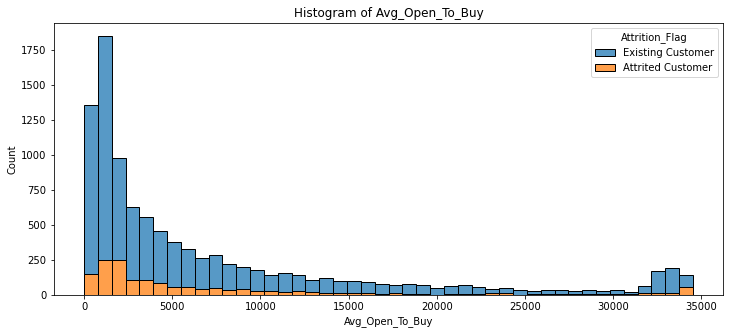

Total_Amt_Chng_Q4_Q1


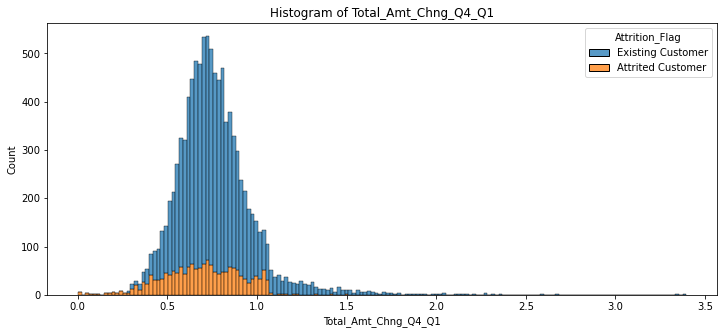

Total_Trans_Amt


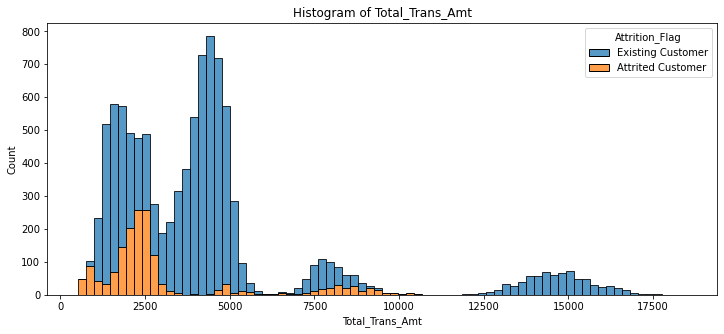

Total_Trans_Ct


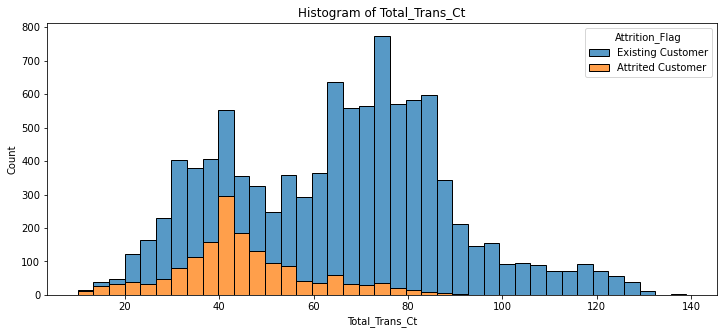

Total_Ct_Chng_Q4_Q1


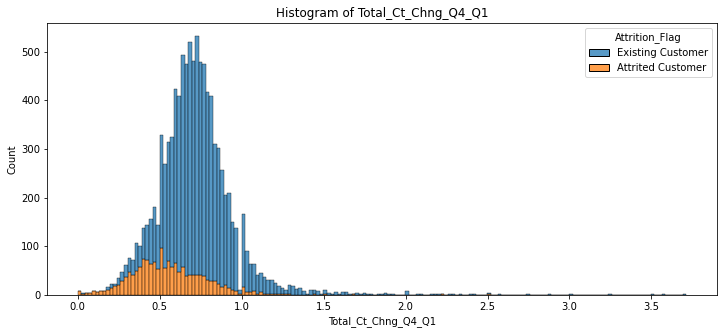

Avg_Utilization_Ratio


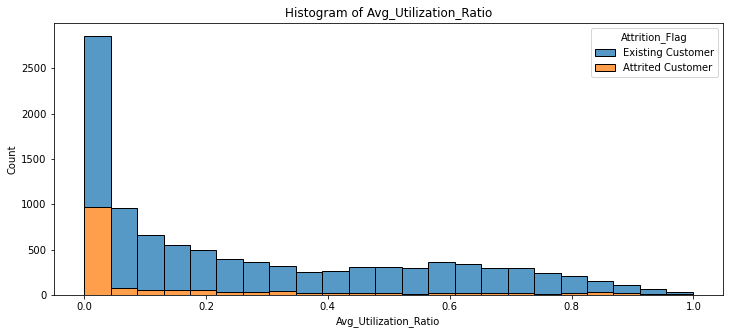

In [31]:
#Plotting a series of histograms
for feature in ["Customer_Age", "Dependent_count", "Months_on_book", "Total_Relationship_Count", "Months_Inactive_12_mon", 
               "Contacts_Count_12_mon", "Credit_Limit", "Total_Revolving_Bal", "Avg_Open_To_Buy", "Total_Amt_Chng_Q4_Q1", 
                "Total_Trans_Amt", "Total_Trans_Ct", "Total_Ct_Chng_Q4_Q1", "Avg_Utilization_Ratio"]:
    print(feature)
    plt.subplots(figsize=(12, 5))
    sns.histplot(x = feature, hue = "Attrition_Flag", multiple = "stack", data = data)
    plt.title("Histogram of "+ feature)
    plt.show()
    plt.close()

# Plotting Scatter Plots

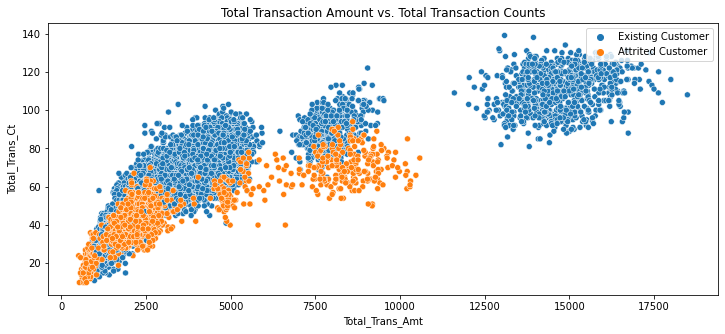

In [32]:
#Plotting a scatter plot with subcategories
plt.subplots(figsize=(12, 5))
sns.scatterplot(x = "Total_Trans_Amt", y = "Total_Trans_Ct", hue = "Attrition_Flag", data = data)
plt.title("Total Transaction Amount vs. Total Transaction Counts")
plt.legend(loc = "upper right")
plt.show()
plt.close()

# Adding Regression Lines to Scatter Plots

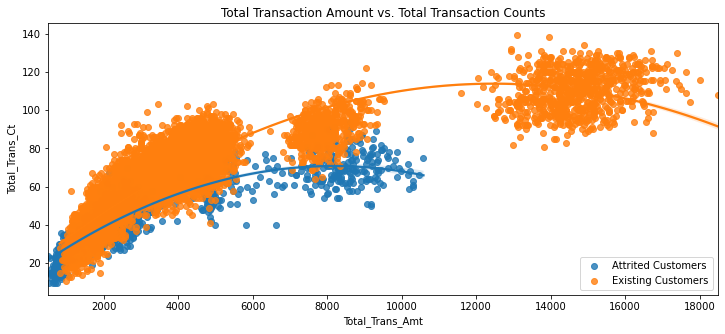

In [33]:
#Plotting a regression plot for each subcategory (Regression = polynomial of order 2)
Attrited_Customers = data.loc[data["Attrition_Flag"] == "Attrited Customer"]
Existing_Customers = data.loc[data["Attrition_Flag"] == "Existing Customer"]

plt.subplots(figsize=(12, 5))
sns.regplot(x = "Total_Trans_Amt", y = "Total_Trans_Ct", data = Attrited_Customers, order = 2, label = "Attrited Customers")
sns.regplot(x = "Total_Trans_Amt", y = "Total_Trans_Ct", data = Existing_Customers, order = 2, label = "Existing Customers")
plt.title("Total Transaction Amount vs. Total Transaction Counts")
plt.legend(loc = "lower right")
plt.show()
plt.close()

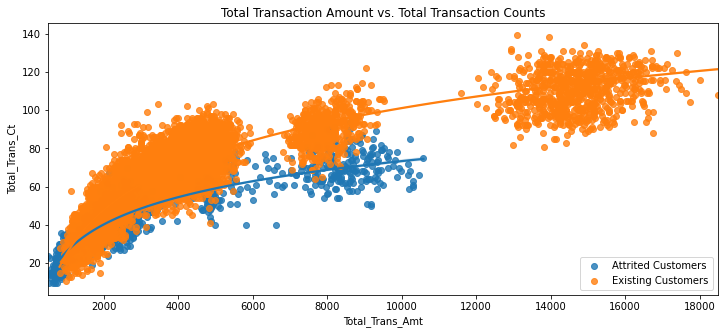

In [34]:
#Plotting a regression plot for each subcategory (Regression = Log)
plt.subplots(figsize=(12, 5))
sns.regplot(x = "Total_Trans_Amt", y = "Total_Trans_Ct", data = Attrited_Customers, logx = True, label = "Attrited Customers")
sns.regplot(x = "Total_Trans_Amt", y = "Total_Trans_Ct", data = Existing_Customers, logx = True, label = "Existing Customers")
plt.title("Total Transaction Amount vs. Total Transaction Counts")
plt.legend(loc = "lower right")
plt.show()
plt.close()

# Plotting Pairplots

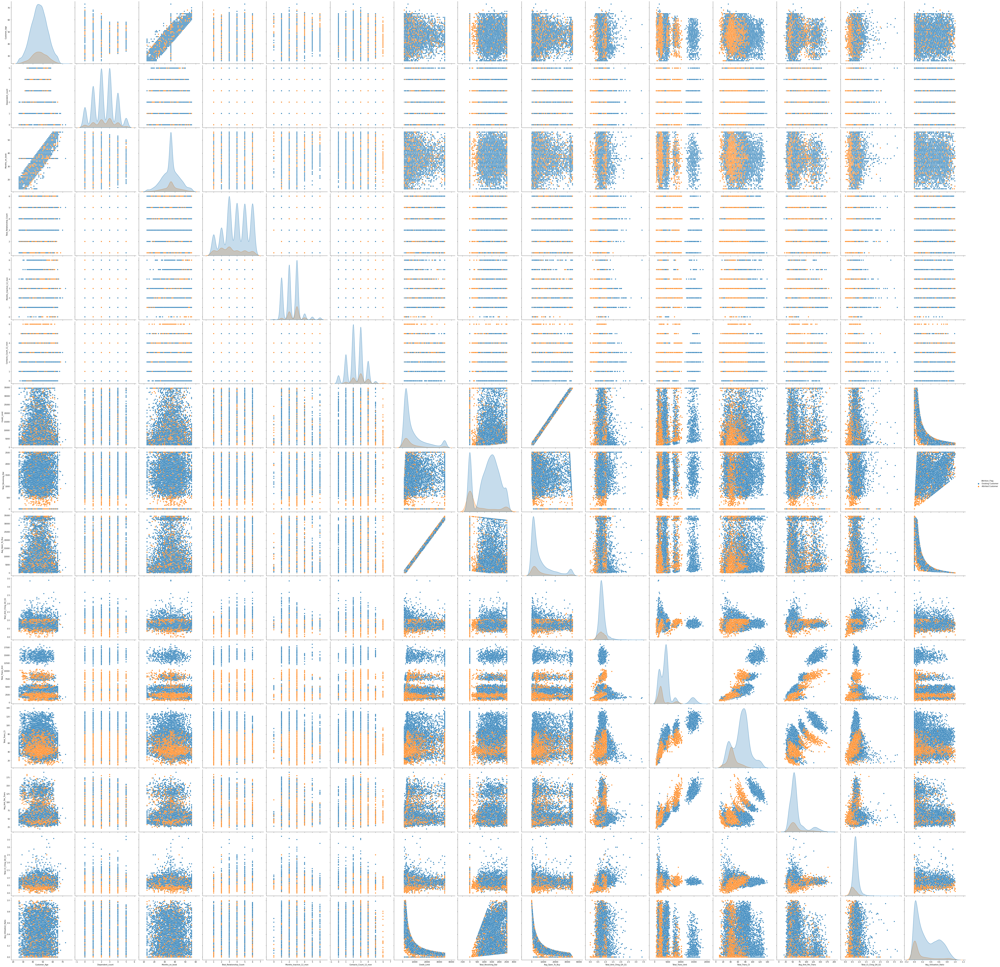

In [35]:
sns.pairplot(data, hue="Attrition_Flag", height = 5)
plt.show()
plt.close()